<font color=blue><b>Rodriguez Quintana Josue Daniel<br>
Jennifer Deborah<br>
    </b></font> 
# Seminar III: Data Analytics
## Efficiency and Fairness in On-Demand Ridesourcing

<center><b>
Prof. Dr. Dr. Lars Schmidt-Thieme,<br>
<br>
Information Systems and Machine Learning Lab<br>
University of Hildesheim<br>
</b>
    <br>
    <br>
    <img src="https://upload.wikimedia.org/wikipedia/commons/thumb/b/b0/Universit%C3%A4t_Hildesheim_logo.svg/1200px-Universit%C3%A4t_Hildesheim_logo.svg.png" height="10%" width="10%">
</center>
<br>This Notebook is a modification from the code obtained from: https://github.com/zxok365/On-Demand-Ridesourcing-Project
<br> Original authors: Nixie S. Lesmana, Xuan Zhang, Xiaohui Bei

In [1]:
import csv
import numpy as np
import pandas as pd
import random
import time
import datetime

import bipartite_algo
from request import *
from vehicle import *
from Waypoint import WayPoint, MapSystem
import ipywidgets as widgets
from ipywidgets import HBox, Label
import folium

In [2]:
w = 0.0 #{0 - efficient allocation, 1 - fair allocation}
lambda_slider = widgets.FloatSlider(
    value=0.5,
    min=0,
    max=1.0,
    step=0.01,
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='.2f',
)

HBox([Label('Fairness λ:'), lambda_slider])

### Parameter Setting and Simulation Setup

In [3]:
'''Parameter Setting'''
eps = 1e-6
cardinal_const = 1000000

'''Simulation Setup'''
period_length = 30 #i.e. assignment is done each 30-secs
H = 1 #i.e. number of periods # Single period
CAPACITY = 4 #i.e. maximum capacity of vehicles # chi
MAX_WAITING_TIME = 240 #i.e. maximum waiting time for request before picked up
c = 1 #i.e. weightage for trip benefits (active time) compared to the loss (cruising time)

REMOVAL = 500 #i.e. set the allowance for trip removal to manage the network sparsity problems
ratio = 1.2
divisor = 1 #i.e. ratio, divisor to set the balance between HIGH and LOW activity vehicles
seed = 0
day = 6
HOUR = 17
filter_treshold = 10 #to gauge the assignment potential based on reachability of vehicle initial locations (nodes)


In [4]:
DATA_TYPE = 'WHOLE' #i.e. {'WHOLE': whole Manhattan area, 'REGION': parts of the map}
#DATA_TYPE = 'REGION'
if DATA_TYPE == 'WHOLE':
    MIN_LIST = [-float("inf")]
    MAX_LIST = [float("inf")]
else:
    MIN_LIST = [-float("inf")] + list(np.linspace(40.72, 40.74, 3)) + [40.75]
    MAX_LIST = [40.75] + list(np.linspace(40.72, 40.74, 3) + .035) + [float("inf")]

### Generate the road network

In [5]:
manhat_point = pd.read_pickle('../../Data/RoadNetwork/manhat_point.pkl')
manhat_edge = pd.read_pickle('../../Data/RoadNetwork/manhat_edge.pkl')

TMP_msg = manhat_edge.values
NodePos = {}
NearbyNode = {} #Neighbors

for rd_msg in TMP_msg:
    p = int(rd_msg[0])
    q = int(rd_msg[1])
    NodePos[p] = rd_msg[2]
    NodePos[q] = rd_msg[3]

    if NearbyNode.get(p) == None:
        NearbyNode[p] = [q]
    else:
        NearbyNode[p] += [q]

mapsystem = MapSystem()
mapsystem._node_dict = NodePos
mapsystem._nearby_node = NearbyNode

In [6]:
#mapsystem._nearby_node

In [7]:
def plotRoadMap(nodesDict,limit = -1):

    initNod = True
    pN = 0
    if limit == -1:
        limit = 1000000 # Maximum plot 1M points to avoid some memory issue.
    for key,posNode in nodesDict.items():
        if pN >= limit:
            break
        coordNode = [posNode[1],posNode[0]] #change order
        if initNod:
            folium_map = folium.Map(location=coordNode,
                                    zoom_start=13,
                                    tiles="CartoDB dark_matter")
            initNod = False
        
        folium.CircleMarker(location=coordNode,radius=2, weight = 1).add_to(folium_map)
        pN+=1
    return folium_map
road_map_plot = plotRoadMap(mapsystem._node_dict,-1)
road_map_plot

In [8]:
def plotRoadMapEdges(nodesDict,edgesDict,limit = -1):

    initNod = True
    pN = 0
    if limit == -1:
        limit = 1000000 # Maximum plot 1M points to avoid some memory issue.
    for key,posNode in nodesDict.items():
        if pN >= limit:
            break
        coordNode = [posNode[1],posNode[0]] #change order
        if initNod:
            folium_map = folium.Map(location=coordNode,
                                    zoom_start=13,
                                    tiles="CartoDB dark_matter")
            initNod = False
        #Plot the Edges to the other locations:
        for n in edgesDict[key]:
            coordNeighbor = nodesDict[n]
            coordNeighbor = [coordNeighbor[1],coordNeighbor[0]]
            folium.PolyLine(locations=[coordNode, coordNeighbor], color='#f78163').add_to(folium_map)

        folium.CircleMarker(location=coordNode,radius=2, weight = 2).add_to(folium_map)

        pN+=1
    return folium_map
road_map_e_plot = plotRoadMapEdges(mapsystem._node_dict,mapsystem._nearby_node,-1)
road_map_e_plot

### Generate the inter-node travel time

In [9]:
tt_dict = {}
node_dict = {}
tt_list = []

traveltime = pd.read_csv('../../Data/TravelTimePrediction/FinalLookUpTable/time_cost' + str(HOUR) + '.csv', index_col=[0, 1], header=None)
traveltime.columns = [HOUR]
tmp_list = list(traveltime[HOUR])
tot_num = 0

for n1, n2 in zip(traveltime.index.get_level_values(0), traveltime.index.get_level_values(1)):
    
    tt_dict[(n1, n2)] = tmp_list[tot_num]
    node_dict[(n1,n2)] = tot_num
    tot_num += 1        

mapsystem.update_distance(cur_time = 0, distance = tt_dict) #i.e. distance = travel time (in secs)

tt_list += [list(tt_dict.values())]


In [10]:
'''Reading Request Data'''

REQ_DATA = pd.read_pickle('../../Data/RequestGenerator/May_2013_HOUR' + str(HOUR) + '_singlebatch.pkl')

Function lists:<br>
<ol>
    <li><b>closest_node</b> - convert geocoordinates to nearest point index in the road network</li>
    <li><b>status_update</b> - update vehicles and requests' attributes & some arrays 
    for route recording (see l.116-124, 133-140)</li>
    <li><b>compute_routing</b> - take in available taxis and coming requests & output 
    optimal (dependent on specified efficiency-fairness conditions) routes</li>
    </ol>

In [11]:
def closest_node(loc):

    global manhat_point
    
    loc = np.array([loc])
    nodes = np.array(list(manhat_point['Coordinate']))
    dist_2 = np.sum((nodes - loc)**2, axis=1)
    pos = np.argmin(dist_2)
    
    return manhat_point.index[pos]

def status_update(t, V_STORAGE, FIN_ALLOC, STACKED_ROUTE, STACKED_TIME):
    
    for vid in FIN_ALLOC:
        
        cur_v = V_STORAGE[vid]
        destination_list = FIN_ALLOC[vid] #i.e. the assigned routing for vehicle with ID vid
        moving_time = t - cur_v._overall_time #i.e. variable for 'remaining time'; starting with 30 secs (period length)
        prev_moving_time = moving_time
                    
        for (rid, p_or_d) in destination_list: 
            #i.e. rid: request ID, p_or_d: 0-pickup/1-dropoff
            
            cur_r = REQ_STORAGE[rid]
                
            if moving_time < 0:
                break
        
            if p_or_d == 0:
                
                reached, moving_time = mapsystem.move_to_destination(cur_v._waypoint, cur_r._origin_waypoint, moving_time)
                #i.e. reached: binary variable; indication if vehicle cur_v has reached the specified node in the destination_list,
                #moving_time: reduced by the traveltime from cur_v's 'current' position (cur_v._waypoint)
                #to the specified PICKUP node (cur_r._origin_waypoint) in destination_list
                
                if len(cur_v._boarded_requests) != 0:
                    cur_v._active_timecost += prev_moving_time - moving_time
                    cur_r.update_trip_value(0, moving_time - prev_moving_time)
                    
                if reached:
                    cur_v.picking_up(cur_r)                    
                    cur_r.picking_up(t - moving_time)
                    STACKED_ROUTE[vid] += [(rid, p_or_d)]
                    STACKED_TIME[vid] += [t - moving_time]
                
                else:
                    break
    
            if p_or_d == 1:
                reached, moving_time = mapsystem.move_to_destination(cur_v._waypoint,cur_r._destination_waypoint, moving_time)
                #moving_time: see l.113-114, with destination the specified DROPOFF node (cur_r._destination_waypoint)

                cur_v._active_timecost += prev_moving_time - moving_time
                cur_r.update_trip_value(0, moving_time - prev_moving_time)
                    
                if reached:
                    cur_v.finishing(cur_r)
                    cur_r.finishing(t - moving_time)
                    STACKED_ROUTE[vid] += [(rid, p_or_d)]
                    STACKED_TIME[vid] += [t - moving_time]
                
                else:
                    break
            
            prev_moving_time = moving_time
            
def compute_routing(h, t, act_corr, V_STORAGE, REQ_STORAGE, DEMAND_LIST, FIN_ALLOC, switch = 0):

    global req_pos
    
    print('req_pos bf:', req_pos)
    
    for i in range(req_pos, len(REQ_STORAGE)):
        r = REQ_STORAGE[i]
        
        if r._request_time >= h*period_length:
            break
        
        DEMAND_LIST += [r]
        req_pos += 1
    
    print('req_pos aft:', req_pos)    

    TAXI_LIST = [v for v in V_STORAGE if v._arr_time < t]
    
    '''Create bipartite graph and other information to be passed into the main algorithm'''
    RTV_graph = {} #i.e. built based on constraints specified below (see l.211-212, 218-219)
    All_edges = []
    Sorting_weight = [] #i.e. for fairness; needs to account for historical values accumulated by each vehicle
    Value_weight = [] #i.e. for efficiency; needs to capture the maximization of service rate (see l.198 adding in large constant), 
    #wlog it disregards history
    
    NEW_TAXI_LIST = []
    NEW_DEMAND_LIST = []
    index = -1
    
    for v in TAXI_LIST:
        index += 1
        
        '''There are boarded requests, direct addition to FIN_ALLOC'''
        if len(v._boarded_requests) > 0:
            r = v._boarded_requests[0]
            RTV_graph[v._vid] = {r._rid: [r._trip_value, r._trip_active, 0]}            
            FIN_ALLOC[v._vid] = ((r._rid, 1),)
            continue
        
        '''Once assigned, it commits to the assignment, direct addition to FIN_ALLOC'''
        if len(v._assigned_requests) > 0:            
            r = v._assigned_requests[0]
            RTV_graph[v._vid] = {r._rid: [r._trip_value, r._trip_active, 0]}
            FIN_ALLOC[v._vid] = ((r._rid, 0), (r._rid, 1))
            continue
        
        NEW_TAXI_LIST += [v]
        
        '''Adding in empty trip'''
        RTV_graph[v._vid] = {-v._vid - 1: [0, 0, 0]}
        All_edges += [[v._vid, -v._vid - 1]]
        
        Sorting_weight += [v._allocated_value1 + 0]
        Value_weight += [0  + 100000000]
        
        for r in DEMAND_LIST:
            
            if r._assigned == True or r._size > CAPACITY:
                continue
            
            NEW_DEMAND_LIST += [r._rid]
            
            pickup_duration = mapsystem.distance(v._waypoint, r._origin_waypoint)
            waiting_time = (t - r._request_time) + pickup_duration
            
            if r.latest_acceptable_pickup_time <= t + pickup_duration:
                continue
            
            else:
                trip_active = r._trip_length
                trip_value = trip_active - waiting_time
                
                if trip_value < 0 :
                    continue
                    
                RTV_graph[v._vid][r._rid] = [trip_value, trip_active, pickup_duration]
                All_edges += [[v._vid, r._rid]]
                
                Sorting_weight += [v._allocated_value1 + c*trip_active - pickup_duration]  #  Utility = Historical + wr ; wvr = cTvr - cost
                Value_weight += [c*trip_active + 100000000 - pickup_duration] #To compute Efficiency
    
    print('NEW_DEMAND_LIST, len:', len(set(NEW_DEMAND_LIST)))
    
    '''Recording purposes'''
    hist_act = [v._active_timecost for v in TAXI_LIST]
    hist_val = [v._allocated_value1 for v in TAXI_LIST]
    min_vid = hist_val.index(min(hist_val))
    
    print('Active time minmax:', [min(hist_act), max(hist_act)])
    print('activity value minmax:', [min(hist_val), max(hist_val)])
    print('vid min?', min_vid)
            
    print('NUM OF AVAILABLE TAXIS:', len(NEW_TAXI_LIST))
    print('NUM OF REQUESTS:', len(DEMAND_LIST))
    
    '''Solving for optimal route'''
    if len(NEW_TAXI_LIST) > 0:
        #act_corr = lambda
        route_dict = bipartite_algo.solve_rtv_graph(h, H, RTV_graph, NEW_TAXI_LIST, DEMAND_LIST, All_edges, Sorting_weight, Value_weight, act_corr, c)
    else:
        route_dict = {}
    
    act_list = [v._allocated_value1 for v in V_STORAGE]
    min_driver = min(act_list)
    ilp_discr = np.std(act_list)
    value_sum = sum(act_list)
    
    unassigned_supply = len([vid for vid in route_dict if list(route_dict[vid]) == []])
                    
    idle_taxis = []
    unassigned_supply = []
    
    '''Storing the optimal routes (i.e. route_dict) into FIN_ALLOC & updating of vehicle/request attributes'''
    for vid in route_dict:
        if list(route_dict[vid]) == []:
            unassigned_supply += [vid]
            
        FIN_ALLOC[vid] = route_dict[vid]
        cur_v = V_STORAGE[vid]
        cur_v.new_assigning()
        
        for (rid, p_or_d) in FIN_ALLOC[vid]:
            cur_r = REQ_STORAGE[rid]
            if p_or_d == 0:
                cur_r.assigning(vid,t)
                cur_v.assigning(cur_r)
                
        if cur_v.isidle:
            idle_taxis += [cur_v]
        
    for vid in FIN_ALLOC:
        V_STORAGE[vid]._overall_time = t
        
    print('------------------------------------------------------------------')
    print('UNASSIGNED TAXIS',len(unassigned_supply))
    print('IDLE TAXIS', len(idle_taxis))
            
    return value_sum, ilp_discr, min_driver


## DATA GENERATION FOR THE SIMULATION

In [12]:
print('DAY:', day)
print('TRESH:', filter_treshold)
lat_min, lat_max = list(zip(MIN_LIST, MAX_LIST))[0]
    
'''Filter the request data (first 30s, within capacity, trip length >= 400 secs)'''
valid_data = REQ_DATA[REQ_DATA['bydates'] == datetime.date(2013,5,day)]
#Take only N samples to make experiments
#valid_data = valid_data[:45]
#valid_data = valid_data.sample(40)

ORI_REQ_NUM = len(valid_data)
print('NUMREQ from original data:', ORI_REQ_NUM)

chosen_tripid = [valid_data.index[i] for i in range(len(valid_data.index))]
valid_data.head()

DAY: 6
TRESH: 10
NUMREQ from original data: 119


,hack_license,passenger_count,bydates,pickup_coordinates,dropoff_coordinates,arrival_time,pickup_nodes,dropoff_nodes,trip_length,bin_in_60s
2897683,2013007587,1,2013-05-06,"(-73.956894, 40.784317)","(-73.953651, 40.767349)",61200,1743,3724,509.424945,5
2897685,2013007086,1,2013-05-06,"(-73.995148, 40.76022)","(-73.8713, 40.774288)",61200,5467,7525,1352.949573,20
2897686,2013002077,1,2013-05-06,"(-73.870827, 40.773869)","(-73.973351, 40.748222)",61200,7525,6511,988.383768,13
2897691,2013023554,1,2013-05-06,"(-73.870888, 40.773697)","(-74.009247, 40.635292)",61200,7525,1077,1951.739150,30
2897692,2013005092,1,2013-05-06,"(-73.863007, 40.769001)","(-73.986938, 40.768581)",61200,7525,4940,1255.812029,18


### Generate artificial vehicle locations

In [13]:
chosen_nodes = []
for tid in chosen_tripid:
    chosen_nodes += [valid_data.loc[tid, 'pickup_nodes']]

print('ORIGINAL TRIP NODES:', chosen_nodes)
print('how large the duplicates? (len vs lenset):', (len(chosen_nodes), len(set(chosen_nodes))))

ORIGINAL TRIP NODES: [1743, 5467, 7525, 7525, 7525, 2166, 1618, 4817, 6262, 5039, 2707, 2107, 2192, 1848, 2542, 7322, 829, 1978, 7525, 478, 7750, 6529, 4395, 2302, 8959, 5665, 4670, 8817, 2917, 3920, 478, 5791, 2299, 4659, 7420, 2227, 1822, 3137, 2929, 7369, 2415, 1955, 1467, 1016, 8077, 6072, 1268, 3521, 7306, 2731, 1931, 2806, 2716, 2408, 7525, 56, 2053, 2830, 3883, 3179, 478, 1750, 1023, 7322, 2826, 478, 4305, 478, 1280, 3952, 478, 4304, 6156, 3508, 1867, 7514, 1873, 7525, 2415, 2788, 8817, 5741, 7525, 4660, 7525, 734, 2740, 1197, 2327, 2604, 478, 6923, 5960, 7469, 477, 1304, 5582, 7362, 4908, 5776, 6533, 7533, 168, 1192, 7631, 3721, 4342, 3138, 976, 3480, 3521, 2165, 6072, 478, 4424, 134, 7525, 8906, 977]
how large the duplicates? (len vs lenset): (119, 99)


In [14]:
rand_num = np.random.uniform(0,1,len(chosen_nodes))
v_location_ACT = [] #i.e. to initialize locations of HIGH activity vehicles - extremize the environment: exactly on the node of chosen requests
for i in range(len(rand_num)):
    if rand_num[i] <= divisor:
        v_location_ACT += [manhat_point.loc[chosen_nodes[i], 'Coordinate']]

TAXI_TOTAL_NUM = int(ratio/divisor*len(v_location_ACT)) #i.e. set the ratio of high vs low activity vehicles

node_in_areas = {} #i.e. nodes that are within 210s travelling time
for n1 in manhat_point.index:
    node_in_areas[n1] = manhat_point.loc[n1, 'ExtendedNeighbors_210s_1']

v_init_nodes = []
for node in chosen_nodes:
    v_init_nodes += node_in_areas[node]
    
filter_init = [] #i.e. store only the nodes with 'sufficient' reachability potential
for vloc in set(v_init_nodes):
    potential = sum([(vloc in node_in_areas[n1]) for n1 in chosen_nodes])
    
    if potential <= filter_treshold:
        continue
    
    filter_init += [vloc]

print('len v_init:', len(set(v_init_nodes)))
print('HOW LARGE?', len(filter_init))
print('REQUIRED?', TAXI_TOTAL_NUM - len(v_location_ACT))

len v_init: 2374
HOW LARGE? 380
REQUIRED? 23


In [15]:
random.seed(seed)
loc_id = np.random.choice(filter_init, TAXI_TOTAL_NUM - len(v_location_ACT), replace = False)
v_location = [manhat_point.loc[filter_init[i], 'Coordinate'] for i in range(len(loc_id))] #i.e. to initialize locations for LOW activity vehicles

'''Reset V_STORAGE'''
V_STORAGE = np.array([])

In [16]:
for loc in v_location_ACT:
    vid = len(V_STORAGE)
    newv = Vehicle(vid, loc, CAPACITY)
    
    newv._point_id = closest_node(newv._cur_position)
    newv._waypoint = WayPoint(newv._point_id, newv._point_id, 0, 0)
    newv._arr_time = 0
    
    random.seed(vid + 1 + seed)
    newv._allocated_value1 = random.uniform(200, 400) #i.e. set the HIGH historical active time
    
    V_STORAGE = np.append(V_STORAGE, newv)
            
for loc in v_location:
    vid = len(V_STORAGE)
    newv = Vehicle(vid, loc, CAPACITY)
    newv._point_id = closest_node(newv._cur_position)
    newv._waypoint = WayPoint(newv._point_id, newv._point_id, 0, 0)
    
    newv._arr_time = 0
    
    random.seed(vid + 1 + seed)
    newv._allocated_value1 = random.uniform(50, 100) #i.e. set the LOW historical active time
    
    V_STORAGE = np.append(V_STORAGE, newv)             

print('NUM OF TAXIS:', len(V_STORAGE))

NUM OF TAXIS: 142


### Here are built all the requests from the pandas data into an object called Request, in the paper this is defined as R.

In [17]:
'''Reset REQ_STORAGE'''
REQ_STORAGE=np.array([])
# Here are built all the requests from the pandas data into an object called Request, in the paper this is defined as R.
for i in chosen_tripid:
    region = 'None'
    origin = valid_data.loc[i, 'pickup_coordinates']
    destination = valid_data.loc[i, 'dropoff_coordinates']
    trip_length = valid_data.loc[i, 'trip_length']
    size = valid_data.loc[i, ' passenger_count']
    arr_time = 0
    req_ID = len(REQ_STORAGE)
    
    newreq = Request(req_ID, region, origin, destination, arr_time, size, trip_length)
    
    p = valid_data.loc[i, 'pickup_nodes']
    q = valid_data.loc[i, 'dropoff_nodes']
    newreq._origin_closest_node = p
    newreq._destination_closest_node = q
    newreq._origin_waypoint = WayPoint(p, p, 0., 0.)
    newreq._destination_waypoint = WayPoint(q, q, 0., 0.)
    newreq._trip_length = mapsystem.distance(newreq._origin_waypoint, newreq._destination_waypoint)
    newreq._max_waiting_time = MAX_WAITING_TIME
        
    REQ_STORAGE = np.append(REQ_STORAGE, newreq)

REQ_NUM = len(REQ_STORAGE)
print('NUM OF REQS:', REQ_NUM)
removal_rate = REQ_NUM/ORI_REQ_NUM

NUM OF REQS: 119


In [18]:
print(REQ_STORAGE[0]._origin)
print(type(REQ_STORAGE[0]._origin))
print(REQ_STORAGE[0]._destination)

(-73.956894, 40.784317)
<class 'tuple'>
(-73.953651, 40.767349)


In [19]:
def random_color():
    rand = lambda: random.randint(100, 255)
    return '#%02X%02X%02X' % (rand(), rand(), rand()) 
def requestToCoordinates(r):
    r_origin = list(r._origin)[::-1] #the coordinates for folium are inverted
    r_destin = list(r._destination)[::-1]
    r_origin = [float(i) for i in r_origin]
    r_destin = [float(i) for i in r_destin]
    return r_origin,r_destin

def plotRequests(listRequests):
    req_orig,req_dest = requestToCoordinates(listRequests[0])
    folium_map = folium.Map(location=req_orig,
                            zoom_start=13,
                            tiles="CartoDB dark_matter")
    for r in listRequests:
        #req_orig =  [40.784317,-73.956894]
        #req_dest = [40.767349,-73.953651]
        #folium.Marker(location=req_orig,fill=True).add_to(folium_map)
        req_orig,req_dest = requestToCoordinates(r)
        folium.Marker(location=req_orig,icon=folium.Icon(color='green',icon='street-view',prefix='fa')).add_to(folium_map)
        folium.Marker(location=req_dest, icon=folium.Icon(color='red',icon='location-arrow',prefix='fa')).add_to(folium_map)

        folium.PolyLine(locations=[req_orig, req_dest], color=random_color()).add_to(folium_map)
    return folium_map

req_map = plotRequests(REQ_STORAGE)
req_map

In [20]:
def vehicleToCoordinates(v):
    v_pos = list(v._cur_position)[::-1] #the coordinates for folium are inverted
    v_pos = [float(i) for i in v_pos]
    return v_pos

def wayPointIdToCoordinates(rp,dicMap):
    coor = dicMap[rp.A_id]
    return [coor[1],coor[0]]
        
def plotRequestsVehicleRoadmap(listRequests,listVehicles,nodesDict, showOnly=-1,showVehicles = None,showMarkers = True):
    req_orig,req_dest = requestToCoordinates(listRequests[0])
    folium_map = folium.Map(location=req_orig,
                            zoom_start=13,
                            tiles="CartoDB dark_matter")
    countReqSh=0
    for r in listRequests:
        if(showOnly > 0):
            if(countReqSh >= showOnly):
                break

        #req_orig, req_dest= requestToCoordinates(r)
        req_orig = wayPointIdToCoordinates(r._origin_waypoint,nodesDict)
        req_dest = wayPointIdToCoordinates(r._destination_waypoint,nodesDict)

        ranColorRequest = random_color() #Select a random color to join the trips

        if((r._vehicle != -1) and (showVehicles)):
            #Find the vehicle's object with this id.
            id_v = r._vehicle
            for v in listVehicles:
                if(v._vid==id_v):
                    #print("Found ",id_v," coord: ",v._cur_position)
                    veh_loc = vehicleToCoordinates(v)
                    if(showMarkers):
                        folium.Marker(location=veh_loc,icon=folium.Icon(color='blue',icon='taxi',prefix='fa')).add_to(folium_map)
                    folium.PolyLine(locations=[veh_loc, req_orig], color=ranColorRequest).add_to(folium_map)
                    break



        if showMarkers :
            folium.Marker(location=req_orig,icon=folium.Icon(color='green',icon='street-view',prefix='fa')).add_to(folium_map)
            folium.Marker(location=req_dest, icon=folium.Icon(color='red',icon='location-arrow',prefix='fa')).add_to(folium_map)

        folium.PolyLine(locations=[req_orig, req_dest], color=ranColorRequest).add_to(folium_map)

        countReqSh += 1

        
    return folium_map

req_map_no_v = plotRequestsVehicleRoadmap(REQ_STORAGE,V_STORAGE,mapsystem._node_dict,showOnly=-1,showVehicles=None,showMarkers=True)
req_map_no_v

## Starting Simulation

In [21]:
DEMAND_LIST = []
STACKED_ROUTE = [[] for i in range(TAXI_TOTAL_NUM)]
STACKED_TIME = [[] for i in range(TAXI_TOTAL_NUM)]

w = lambda_slider.value

req_pos = 0          
weight_trial = [w for i in range(H)]

print('WEIGHT (Fairness):', w)
weight_type = w

switch = 0

WEIGHT (Fairness): 0.5


In [22]:
for h in range(1, H+1):
   
    print('PERIOD', h)
    print('===========================================')

    act_corr = weight_trial[h-1]
    t = h*period_length
    FIN_ALLOC = {}
    
    DEMAND_LIST = [r for r in DEMAND_LIST if r._assigned == True]
    
    ILP_VALUE, ILP_DISCR, MIN_DRIVER = compute_routing(h, t, act_corr, V_STORAGE, REQ_STORAGE, DEMAND_LIST, FIN_ALLOC, switch)
    
    list_normal = [v._allocated_value1 for v in V_STORAGE]
    
    if np.min(list_normal) > 0:
        switch = 1
        
    print('normal')
    print('std:', np.std(list_normal))
    print('minmax:', (np.min(list_normal), np.max(list_normal)))
    print('----')
    
    if h < H:
        t = (h+1)*period_length
        status_update(t, V_STORAGE, FIN_ALLOC, STACKED_ROUTE, STACKED_TIME)
    
TOT_SERVED, SERVICE_RATE, MEAN_WAIT, MEAN_DELAY, MEAN_INTRIP = [0 for i in range(5)]

PERIOD 1
req_pos bf: 0
req_pos aft: 119
NEW_DEMAND_LIST, len: 119
Active time minmax: [0, 0]
activity value minmax: [50.07550863900854, 395.81002401455487]
vid min? 138
NUM OF AVAILABLE TAXIS: 142
NUM OF REQUESTS: 119
iter 1
matching start:
matching end: 0.12205648422241211
iter 2
matching start:
matching end: 0.1298351287841797
iter 3
matching start:
matching end: 0.11433076858520508
iter 4
matching start:
matching end: 0.1232750415802002
iter 5
matching start:
matching end: 0.12351274490356445
iter 6
matching start:
matching end: 0.10811543464660645
iter 7
matching start:
matching end: 0.10914492607116699
iter 8
matching start:
matching end: 0.11781144142150879
iter 9
matching start:
matching end: 0.1240854263305664
iter 10
matching start:
matching end: 0.11670279502868652
iter 11
matching start:
matching end: 0.11726117134094238
iter 12
matching start:
matching end: 0.1502387523651123
iter 13
matching start:
matching end: 0.12099766731262207
iter 14
matching start:
matching end: 0.1

In [ ]:
def plotRequestsVehicle(listRequests,listVehicles,showOnly=-1):
    req_orig,req_dest = requestToCoordinates(listRequests[0])
    folium_map = folium.Map(location=req_orig,
                            zoom_start=13,
                            tiles="CartoDB dark_matter")
    countReqSh=0
    for r in listRequests:
        if(showOnly > 0):
            if(countReqSh >= showOnly):
                break
        req_orig,req_dest = requestToCoordinates(r)

        ranColorRequest = random_color() #Select a random color to join the trips
        if(r._vehicle != -1):
            #Find the vehicle's object with this id.
            id_v = r._vehicle
            for v in listVehicles:
                if(v._vid==id_v):
                    #print("Found ",id_v," coord: ",v._cur_position)
                    veh_loc = vehicleToCoordinates(v)
                    folium.Marker(location=veh_loc,icon=folium.Icon(color='blue',icon='taxi',prefix='fa')).add_to(folium_map)
                    folium.PolyLine(locations=[veh_loc, req_orig], color=ranColorRequest).add_to(folium_map)
                    break



        
        folium.Marker(location=req_orig,icon=folium.Icon(color='green',icon='street-view',prefix='fa')).add_to(folium_map)
        folium.Marker(location=req_dest, icon=folium.Icon(color='red',icon='location-arrow',prefix='fa')).add_to(folium_map)

        folium.PolyLine(locations=[req_orig, req_dest], color=ranColorRequest).add_to(folium_map)

        countReqSh += 1

        
    return folium_map

#req_map_v = plotRequestsVehicle(REQ_STORAGE,V_STORAGE,showOnly=-1)
#req_map_v

In [28]:
req_map_v = plotRequestsVehicleRoadmap(REQ_STORAGE,V_STORAGE,mapsystem._node_dict,showOnly=-1,showVehicles=True)
req_map_v

Min:  329.6994439957766
Max:  2211.519316178378


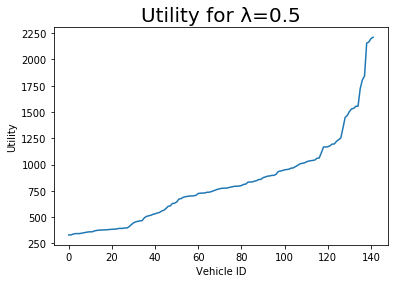

In [27]:
utilitiyHistory = list_normal[:] # Copy by reference
utilitiyHistory.sort() #Sort vehicles utility from less to more
print("Min: ",utilitiyHistory[0])
print("Max: ",utilitiyHistory[-1])
import matplotlib.pyplot as plt


x_vehicles = range(len(utilitiyHistory))

plt.plot(x_vehicles, utilitiyHistory)
plt.title('Utility for λ='+str(w), fontsize=20)
plt.xlabel('Vehicle ID')
plt.ylabel('Utility')
plt.show()

<class 'int'>
Found  116  coord:  (-73.931792, 40.794482)


7525

In [26]:
f = open('Tradeoff_w_Horizons.csv', 'a', newline = '')
to_append = [[DATA_TYPE, REMOVAL, removal_rate, MAX_WAITING_TIME, lat_min, HOUR, H, TAXI_TOTAL_NUM, REQ_NUM, weight_trial, 
              TOT_SERVED, SERVICE_RATE, MEAN_WAIT, MEAN_DELAY, MEAN_INTRIP,
              np.sum(list_normal), np.std(list_normal), np.min(list_normal), np.max(list_normal)]]
writer = csv.writer(f)
writer.writerows(to_append)
f.close()

'''Record list_normal as column'''
f = open('ActiveTime.csv', 'a', newline = '')
to_append = [[HOUR, weight_type] + list_normal]
writer = csv.writer(f)
writer.writerows(to_append)
f.close()